In [15]:
import os
import glob
import time

import torch
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

from torchvision.transforms.functional import to_tensor
from torchvision.models.detection import (
    fasterrcnn_resnet50_fpn,
    retinanet_resnet50_fpn
)

image_paths = sorted(glob.glob("img*.jp*g"))  # matches jpg & jpeg

print("Found", len(image_paths), "images:")
for p in image_paths:
    print(p)

Found 10 images:
img1.jpg
img10.jpeg
img2.jpeg
img3.jpeg
img4.jpeg
img5.jpeg
img6.jpeg
img7.jpeg
img8.jpeg
img9.jpeg


In [16]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

faster_rcnn = fasterrcnn_resnet50_fpn(weights="DEFAULT")
faster_rcnn = faster_rcnn.to(device)
faster_rcnn.eval()

retinanet = retinanet_resnet50_fpn(weights="DEFAULT")
retinanet = retinanet.to(device)
retinanet.eval()

print("Models loaded.")

Using device: cpu
Models loaded.


In [18]:
def run_detection(model, model_name, image_paths, score_thresh=0.5):
    """
    Runs object detection on each image and records:
    - number of detections above threshold
    - average & max confidence of those detections
    - inference time per image
    """
    records = []

    for img_path in image_paths:
        img_name = os.path.basename(img_path)

        img = Image.open(img_path).convert("RGB")
        img_tensor = to_tensor(img).to(device)

        start_time = time.time()
        with torch.no_grad():
            outputs = model([img_tensor])[0]
        end_time = time.time()
        elapsed = end_time - start_time

        scores = outputs["scores"].detach().cpu()

        keep = scores >= score_thresh
        num_detections = int(keep.sum().item())

        if num_detections > 0:
            kept_scores = scores[keep]
            avg_score = float(kept_scores.mean().item())
            max_score = float(kept_scores.max().item())
        else:
            avg_score = float("nan")
            max_score = float("nan")

        records.append({
            "image_name": img_name,
            "model": model_name,
            "num_detections": num_detections,
            "avg_confidence": avg_score,
            "max_confidence": max_score,
            "inference_time_sec": elapsed
        })

    return pd.DataFrame(records)

In [23]:
df_faster = run_detection(faster_rcnn, "Faster R-CNN", image_paths, score_thresh=0.5)

df_retina = run_detection(retinanet, "RetinaNet", image_paths, score_thresh=0.5)

results = pd.concat([df_faster, df_retina], ignore_index=True)
results

,image_name,model,num_detections,avg_confidence,max_confidence,inference_time_sec
0,img1.jpg,Faster R-CNN,25,0.802579,0.992242,1.756249
1,img10.jpeg,Faster R-CNN,3,0.826990,0.988941,0.942552
2,img2.jpeg,Faster R-CNN,2,0.664708,0.763103,1.129169
3,img3.jpeg,Faster R-CNN,3,0.834931,0.998070,1.267097
4,img4.jpeg,Faster R-CNN,35,0.689043,0.973258,1.259211
5,img5.jpeg,Faster R-CNN,1,0.986878,0.986878,1.452360
6,img6.jpeg,Faster R-CNN,9,0.853828,0.972868,1.155227
7,img7.jpeg,Faster R-CNN,11,0.769182,0.999232,1.068328
8,img8.jpeg,Faster R-CNN,9,0.847954,0.999157,1.484182
9,img9.jpeg,Faster R-CNN,2,0.997251,0.997736,1.012872


In [22]:
comparison_table = results.pivot_table(
    index="image_name",
    columns="model",
    values=["num_detections", "avg_confidence", "inference_time_sec"]
)

comparison_rounded = comparison_table.round(3)
comparison_rounded

avg_confidence           inference_time_sec            \
model        Faster R-CNN RetinaNet       Faster R-CNN RetinaNet   
image_name                                                         
img1.jpg            0.803     0.633              1.441     1.419   
img10.jpeg          0.827     0.879              1.315     1.021   
img2.jpeg           0.665       NaN              1.773     1.145   
img3.jpeg           0.835     0.879              1.664     1.373   
img4.jpeg           0.689     0.590              1.512     1.318   
img5.jpeg           0.987     0.861              1.807     1.214   
img6.jpeg           0.854     0.739              1.839     1.070   
img7.jpeg           0.769     0.788              1.390     1.839   
img8.jpeg           0.848     0.829              1.966     1.845   
img9.jpeg           0.997     0.954              1.501     1.175   

           num_detections            
model        Faster R-CNN RetinaNet  
image_name                           
img1.jpg             25.0       7.0  
img10.jpeg            3.0       1.0  
img2.jpeg             2.0       0.0  
img3.jpeg             3.0       2.0  
img4.jpeg            35.0      11.0  
img5.jpeg             1.0       1.0  
img6.jpeg             9.0       5.0  
img7.jpeg            11.0       5.0  
img8.jpeg             9.0       4.0  
img9.jpeg             2.0       2.0

In [24]:
from torchvision.models import resnet50, ResNet50_Weights
import torch.nn.functional as F

weights = ResNet50_Weights.DEFAULT
resnet = resnet50(weights=weights).to(device)
resnet.eval()
preprocess = weights.transforms()
categories = weights.meta["categories"]

extra_records = []

for img_path in image_paths:
    img_name = os.path.basename(img_path)
    img = Image.open(img_path).convert("RGB")

    input_tensor = preprocess(img).unsqueeze(0).to(device)

    with torch.no_grad():
        output = resnet(input_tensor)

    probs = F.softmax(output[0], dim=0)
    top_prob, top_idx = torch.topk(probs, 1)
    top_prob = float(top_prob.item())
    top_label = categories[int(top_idx.item())]

    extra_records.append({
        "image_name": img_name,
        "top_class_label": top_label,
        "top_class_probability": top_prob
    })

extra_df = pd.DataFrame(extra_records)
extra_df

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /Users/dborch/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████████████████████████████████| 97.8M/97.8M [00:05<00:00, 17.2MB/s]


,image_name,top_class_label,top_class_probability
0,img1.jpg,golfcart,0.120372
1,img10.jpeg,liner,0.499475
2,img2.jpeg,lakeside,0.194304
3,img3.jpeg,Irish setter,0.164789
4,img4.jpeg,racer,0.185557
5,img5.jpeg,sports car,0.195461
6,img6.jpeg,sorrel,0.181991
7,img7.jpeg,hair spray,0.050975
8,img8.jpeg,planetarium,0.071377
9,img9.jpeg,ballplayer,0.701244



===== img1.jpg — Faster R-CNN =====


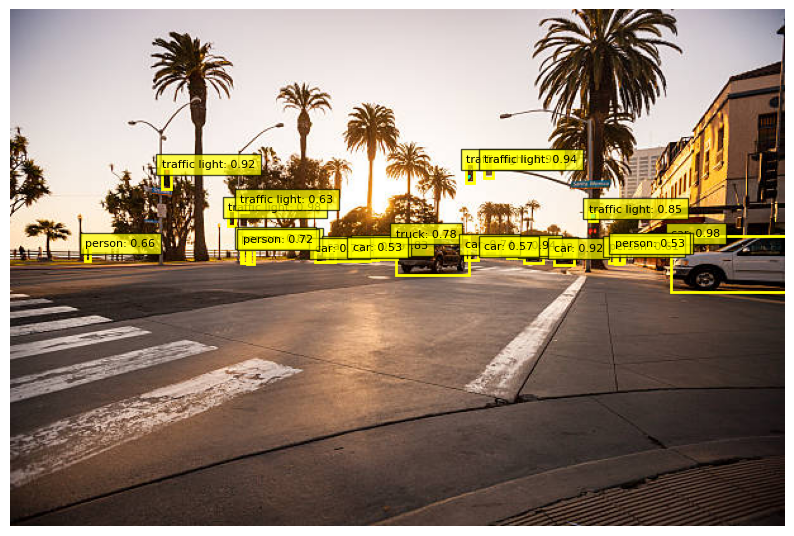


===== img1.jpg — RetinaNet =====


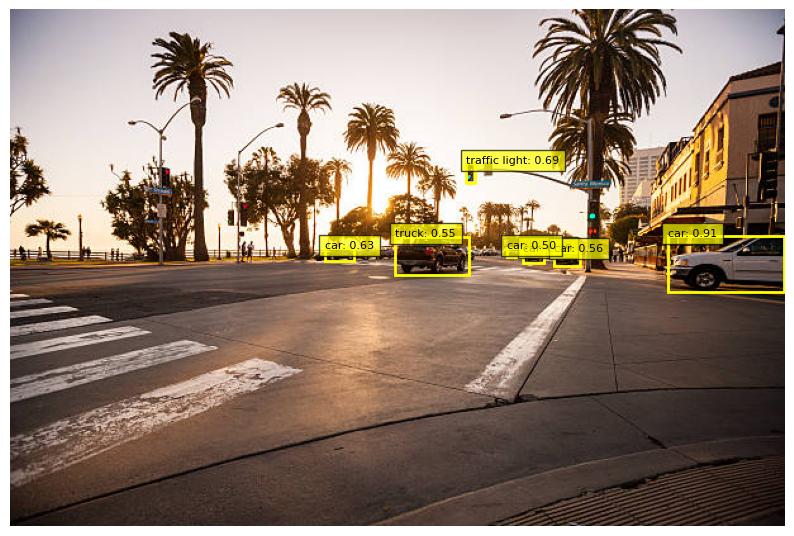


===== img10.jpeg — Faster R-CNN =====


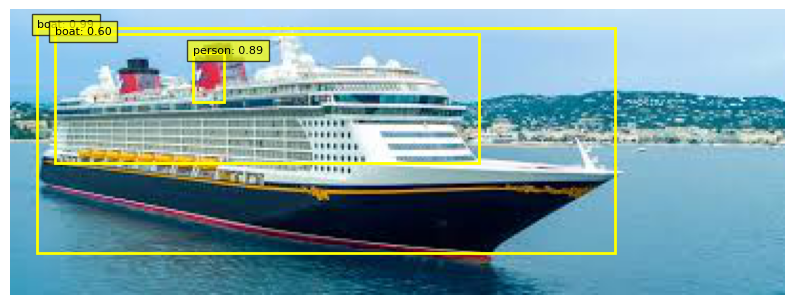


===== img10.jpeg — RetinaNet =====


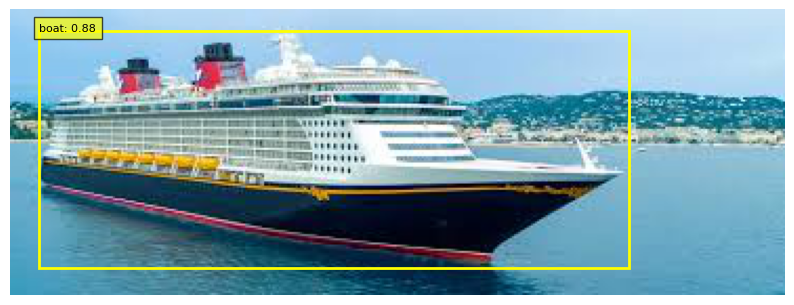


===== img2.jpeg — Faster R-CNN =====


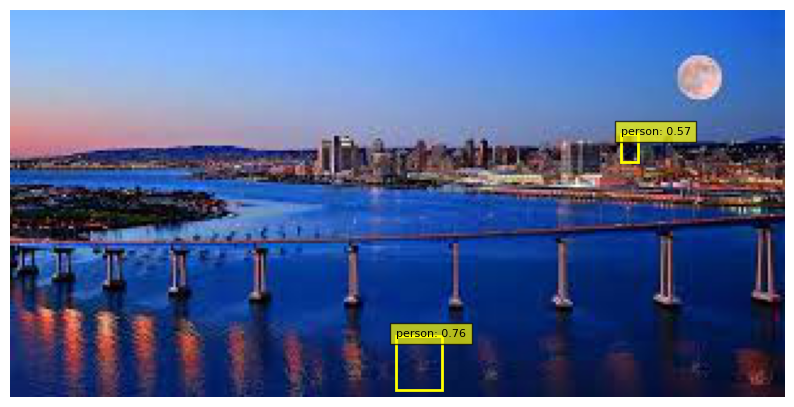


===== img2.jpeg — RetinaNet =====


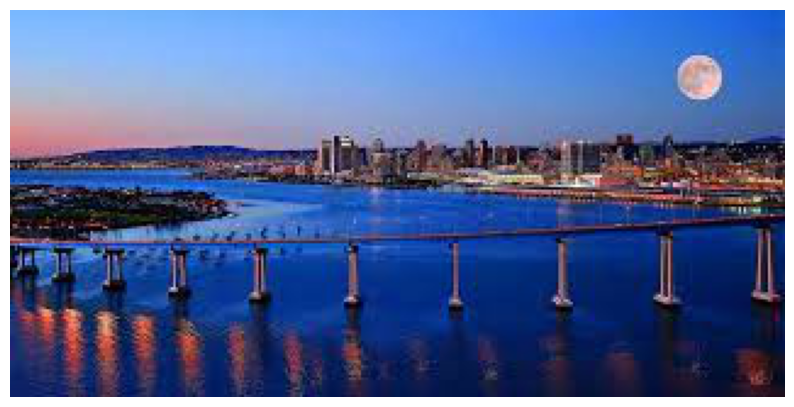


===== img3.jpeg — Faster R-CNN =====


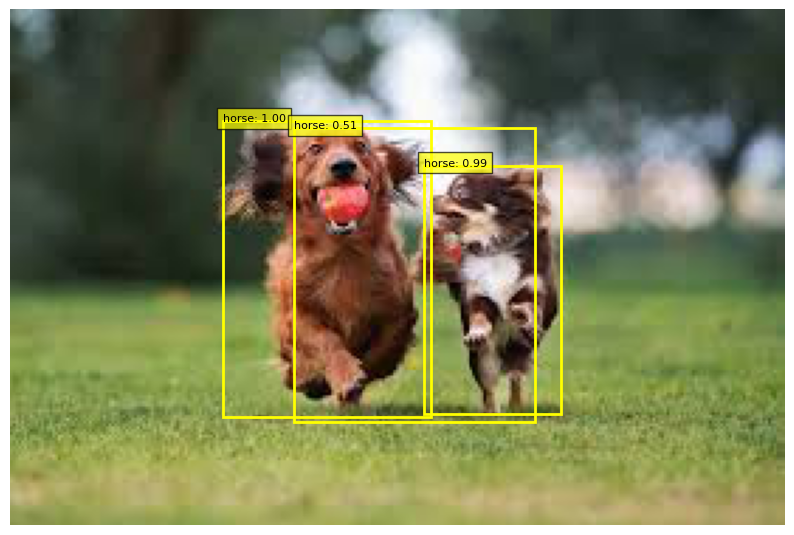


===== img3.jpeg — RetinaNet =====


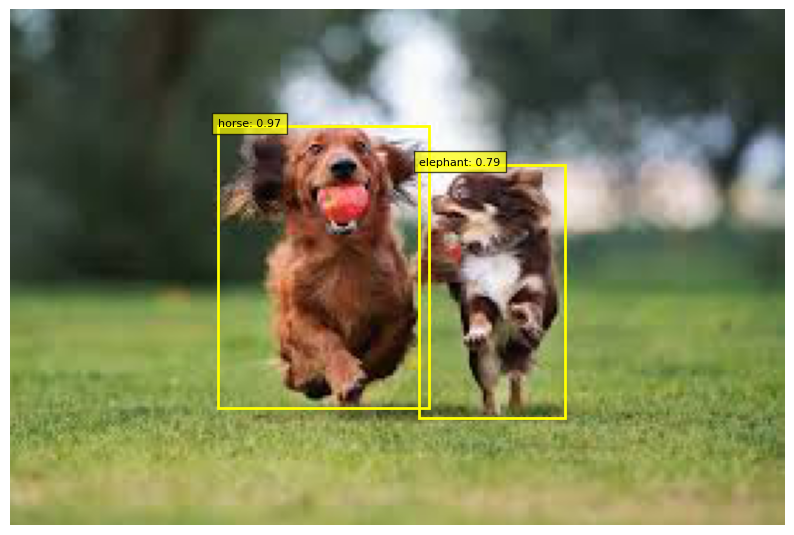


===== img4.jpeg — Faster R-CNN =====


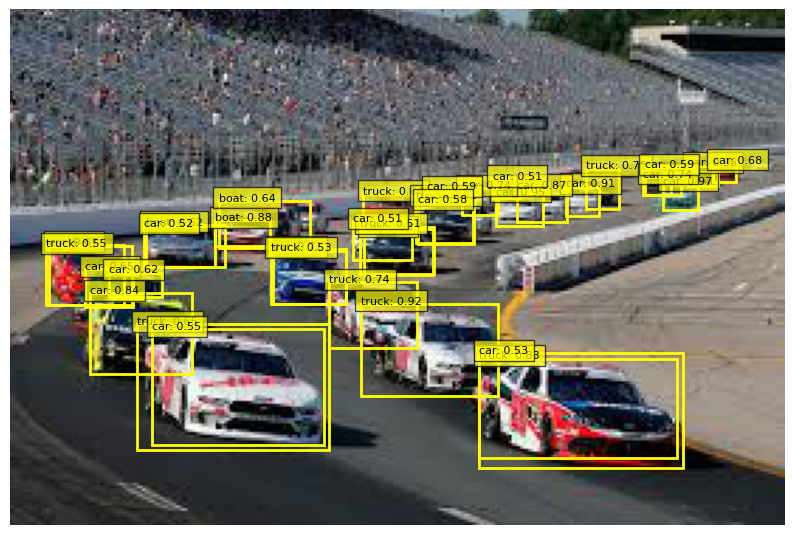


===== img4.jpeg — RetinaNet =====


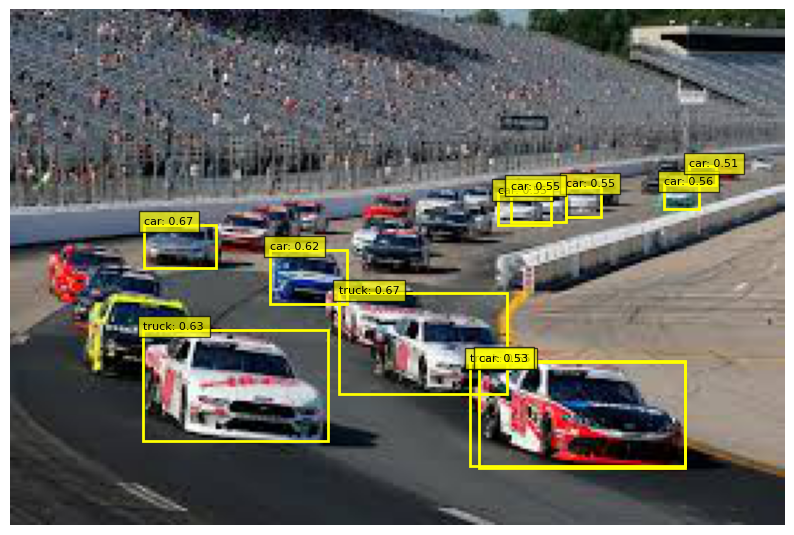


===== img5.jpeg — Faster R-CNN =====


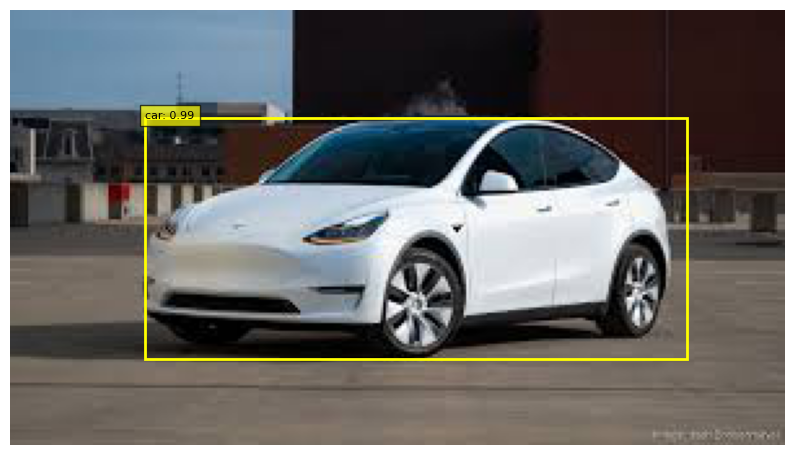


===== img5.jpeg — RetinaNet =====


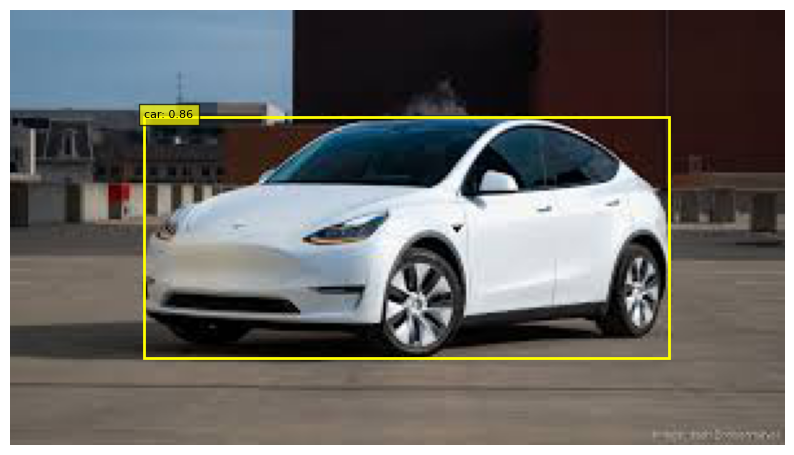


===== img6.jpeg — Faster R-CNN =====


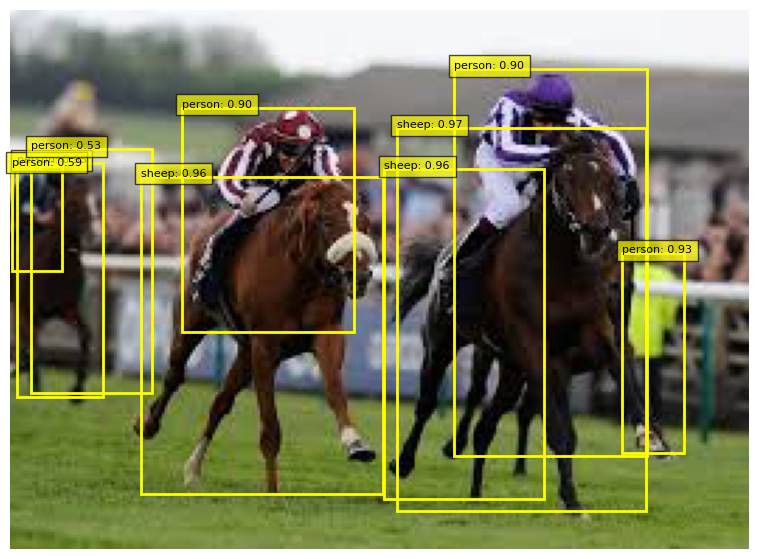


===== img6.jpeg — RetinaNet =====


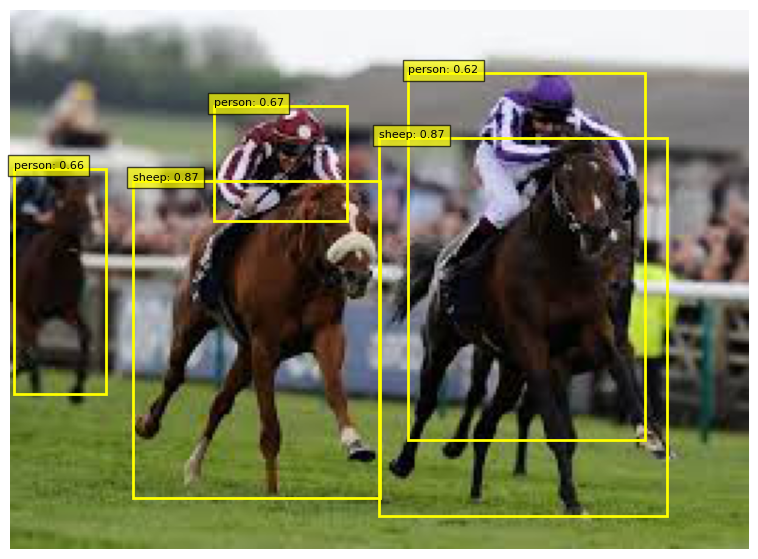


===== img7.jpeg — Faster R-CNN =====
Error processing img7.jpeg: list index out of range

===== img8.jpeg — Faster R-CNN =====


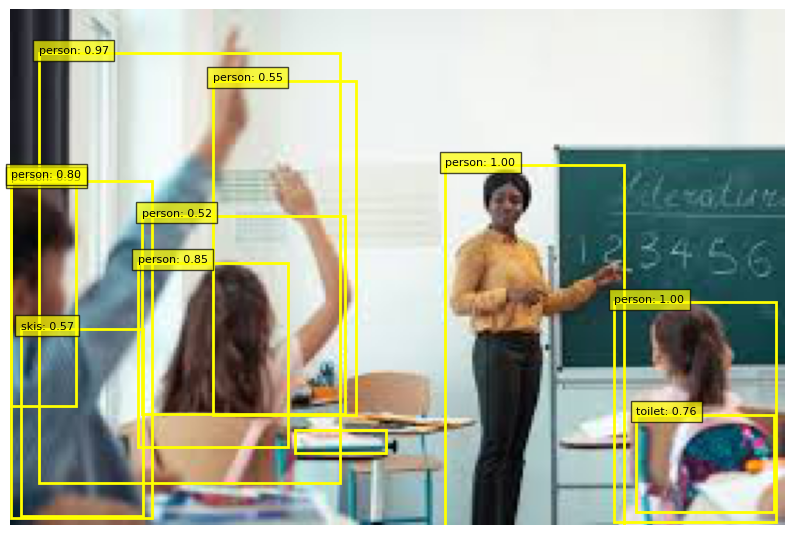

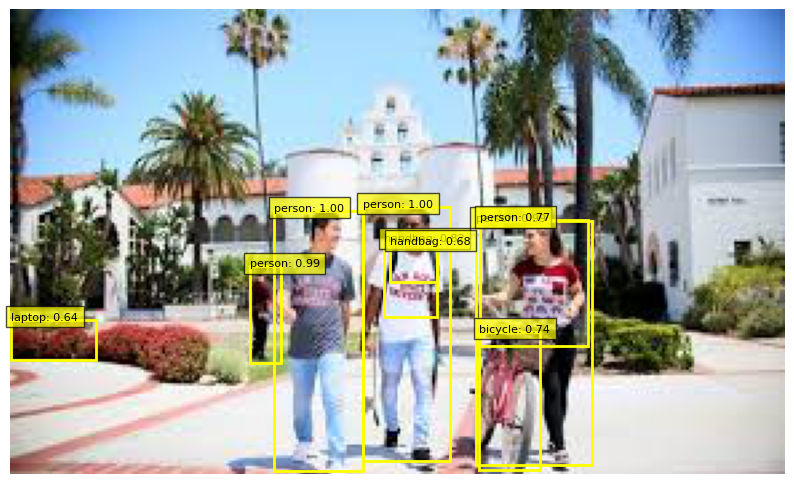


===== img8.jpeg — RetinaNet =====


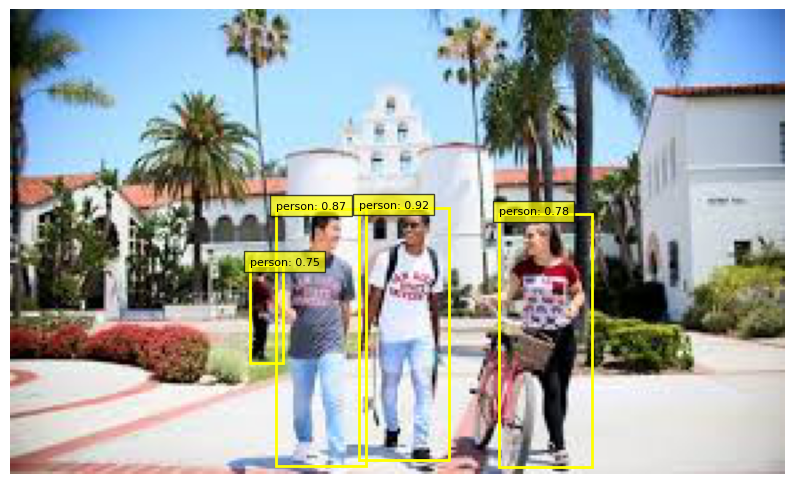


===== img9.jpeg — Faster R-CNN =====


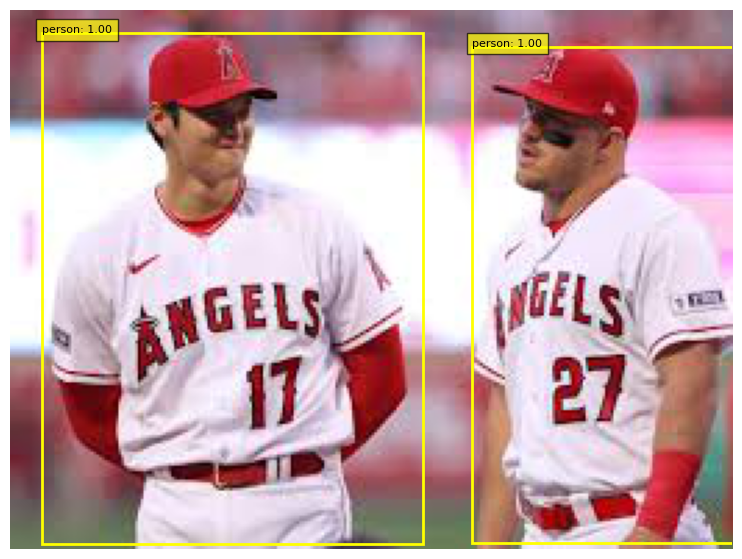


===== img9.jpeg — RetinaNet =====


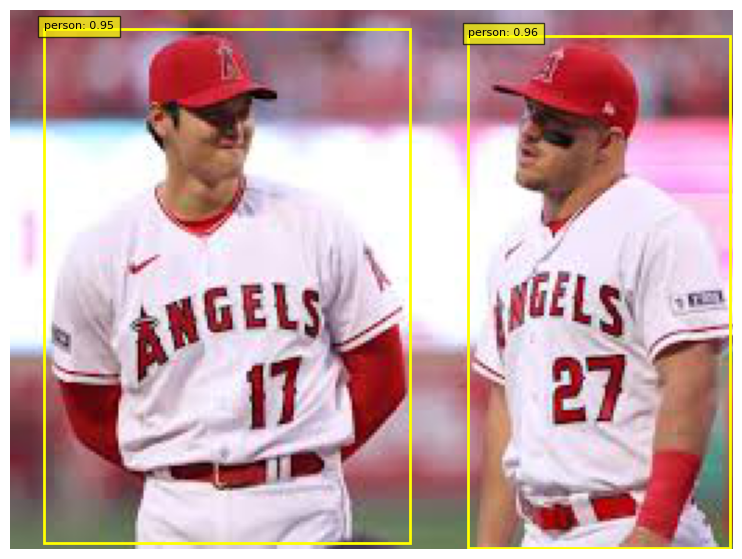

In [32]:
# Loop over all images and show detections for both models

for img_path in image_paths:
    try:
        img_name = os.path.basename(img_path)
        
        print(f"\n===== {img_name} — Faster R-CNN =====")
        show_detections(img_path, faster_rcnn, score_thresh=0.5)
        
        print(f"\n===== {img_name} — RetinaNet =====")
        show_detections(img_path, retinanet, score_thresh=0.5)
    except IndexError as e:
        print(f"Error processing {img_name}: {e}")
        # Optionally, continue to the next image
        continue
    except Exception as e:
        print(f"Unexpected error with {img_name}: {e}")
        continue